In [1]:
import pandas as pd
import os

base_path = "/datasets/multi-view-pig-posture-recognition"

# Laden der Trainingsdaten
train1_df = pd.read_csv(os.path.join(base_path, 'train1.csv'))
train2_df = pd.read_csv(os.path.join(base_path, 'train2.csv'))

train_df = pd.concat([train1_df, train2_df], ignore_index=True)

print(train_df.head())

<jemalloc>: Unsupported system page size


                                     row_id  \
0  train_pen1_orb_cam1_20250108_085204_0000   
1  train_pen1_orb_cam1_20250108_085204_0001   
2  train_pen1_orb_cam1_20250108_085204_0002   
3  train_pen1_orb_cam1_20250108_085204_0003   
4  train_pen1_orb_cam1_20250108_085204_0004   

                            image_id  width  height  \
0  pen1_orb_cam1_20250108_085204.jpg   1920    1080   
1  pen1_orb_cam1_20250108_085204.jpg   1920    1080   
2  pen1_orb_cam1_20250108_085204.jpg   1920    1080   
3  pen1_orb_cam1_20250108_085204.jpg   1920    1080   
4  pen1_orb_cam1_20250108_085204.jpg   1920    1080   

                         bbox  class_id  
0  [1031.5,368.0,349.0,435.0]         0  
1  [1278.5,428.0,233.0,438.0]         4  
2   [732.0,137.5,342.0,198.0]         1  
3   [830.0,169.0,370.0,263.0]         0  
4   [611.5,314.8,381.5,386.6]         3  


In [2]:
# Zeigt alle Spaltennamen an
print("Spalten im Dataframe:", train_df.columns.tolist())

print("\nInhalt der ersten Zeile:")
print(train_df.iloc[0])

Spalten im Dataframe: ['row_id', 'image_id', 'width', 'height', 'bbox', 'class_id']

Inhalt der ersten Zeile:
row_id      train_pen1_orb_cam1_20250108_085204_0000
image_id           pen1_orb_cam1_20250108_085204.jpg
width                                           1920
height                                          1080
bbox                      [1031.5,368.0,349.0,435.0]
class_id                                           0
Name: 0, dtype: object


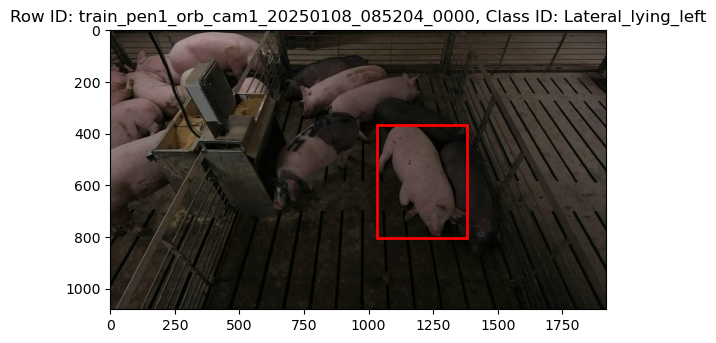

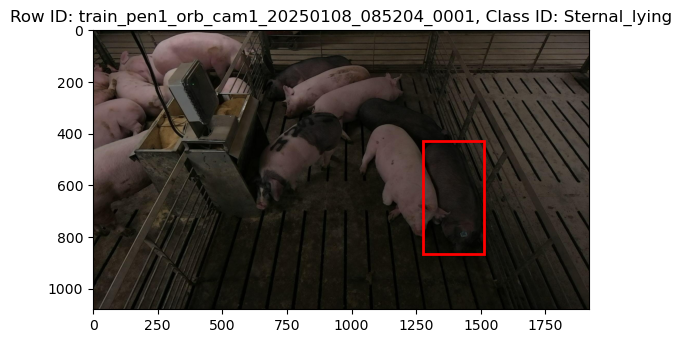

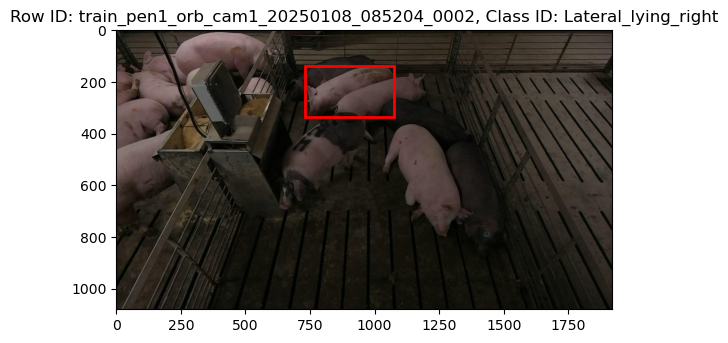

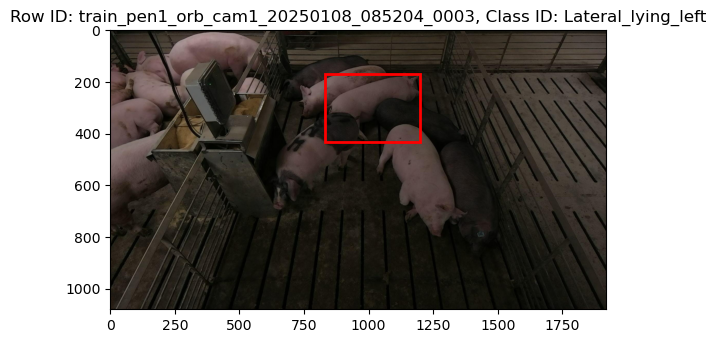

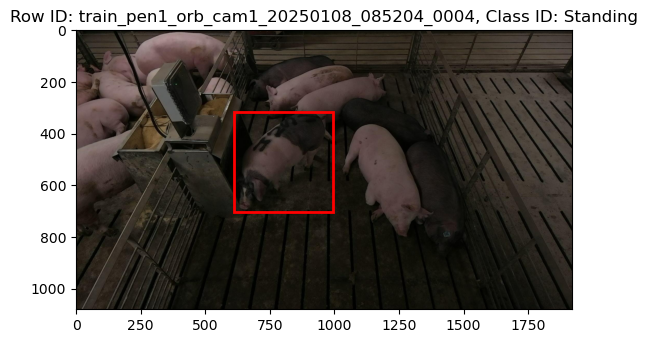

In [3]:
# data paths
train1_path = "/datasets/multi-view-pig-posture-recognition/train1_images"
train2_path = "/datasets/multi-view-pig-posture-recognition/train2_images"
test_path = "/datasets/multi-view-pig-posture-recognition/test_images"
# csv path with row_id, image_id, width, height, bbox, class_id
train1_csv = "/datasets/multi-view-pig-posture-recognition/train1.csv"
train2_csv = "/datasets/multi-view-pig-posture-recognition/train2.csv"
test_csv = "/datasets/multi-view-pig-posture-recognition/test.csv"
# pig posture classes
pig_posture_classes = {
    0: "Lateral_lying_left",
    1: "Lateral_lying_right",
    2: "Sitting",
    3: "Standing",
    4: "Sternal_lying"
}

import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
train1 = pd.read_csv(train1_csv)
train2 = pd.read_csv(train2_csv)
test = pd.read_csv(test_csv)
#show the first 5 rows of train1 paired with their images and their bboxes drawn on the images
for i in range(5):
    row = train1.iloc[i]
    image_id = row["image_id"]
    image_path = f"{train1_path}/{image_id}"
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f"Row ID: {row['row_id']}, Class ID: {pig_posture_classes[row['class_id']]}")
    # draw the bbox on the image
    bbox = eval(row["bbox"])
    x, y, w, h = bbox
    plt.gca().add_patch(plt.Rectangle((x, y), w, h, fill=False, edgecolor='red', linewidth=2))
    plt.show()

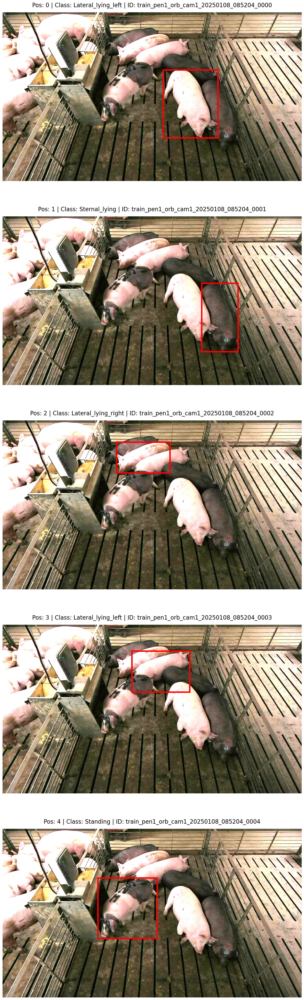

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
import os
import ast

# Datenpfade
train1_path = "/datasets/multi-view-pig-posture-recognition/train1_images"
train1_csv = "/datasets/multi-view-pig-posture-recognition/train1.csv"

pig_posture_classes = {
    0: "Lateral_lying_left",
    1: "Lateral_lying_right",
    2: "Sitting",
    3: "Standing",
    4: "Sternal_lying"
}

# Daten laden
train1 = pd.read_csv(train1_csv)

# Anzahl der Bilder
num_images = 5
brightness_level = 3.5  #kann man anpassen

fig, axes = plt.subplots(num_images, 1, figsize=(12, 8 * num_images))

for i in range(num_images):
    row = train1.iloc[i]
    image_path = os.path.join(train1_path, row["image_id"])
    
    try:
        
        img = Image.open(image_path)
        
        enhancer = ImageEnhance.Brightness(img)
        img = enhancer.enhance(brightness_level)
        
        # Plotten
        axes[i].imshow(img)
        
        # Bounding Box
        bbox = ast.literal_eval(row["bbox"])
        x, y, w, h = bbox
        
        # Box zeichnen 
        rect = plt.Rectangle((x, y), w, h, fill=False, edgecolor='red', linewidth=4)
        axes[i].add_patch(rect)
        
        # Titel & Achsen
        class_name = pig_posture_classes[row['class_id']]
        axes[i].set_title(f"Pos: {i} | Class: {class_name} | ID: {row['row_id']}", fontsize=16, pad=15)
        axes[i].axis('off')
        
    except Exception as e:
        axes[i].set_title(f"Fehler beim Laden von {row['image_id']}: {e}")
        axes[i].axis('off')

plt.tight_layout()
plt.show()

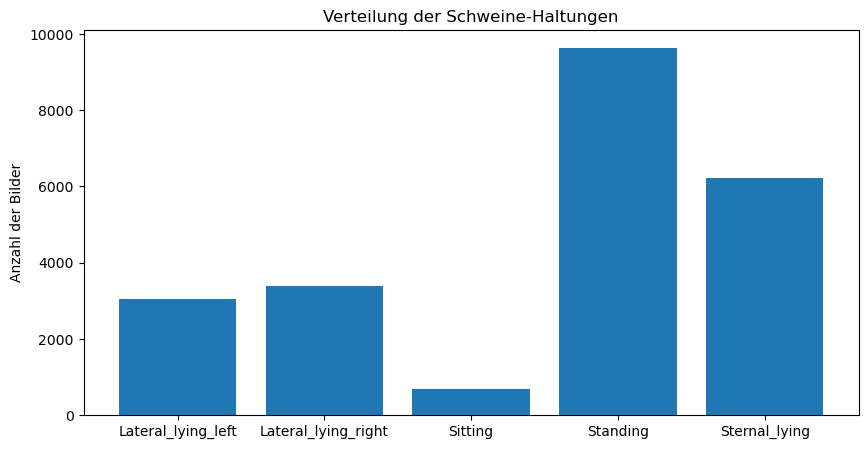

In [5]:
# Prüfe die Verteilung der Klassen
class_counts = train1['class_id'].value_counts().sort_index()
class_names = [pig_posture_classes[i] for i in class_counts.index]

plt.figure(figsize=(10, 5))
plt.bar(class_names, class_counts.values)
plt.title("Verteilung der Schweine-Haltungen")
plt.ylabel("Anzahl der Bilder")
plt.show()

In [6]:
import pandas as pd
import ast
import os

def prepare_multi_view_df(df):
    # Erzeuge einen Schlüssel ohne Kamera-Bezeichnung für das Matching
    df['match_key'] = df['row_id'].str.replace('cam1_', '').str.replace('cam2_', '')
    
    # Trennen in Cam1 und Cam2
    cam1_df = df[df['row_id'].str.contains('cam1')].copy()
    cam2_df = df[df['row_id'].str.contains('cam2')].copy()
    
    # Zusammenführen (Merge) der beiden Perspektiven
    merged = pd.merge(
        cam1_df[['match_key', 'image_id', 'bbox', 'class_id']], 
        cam2_df[['match_key', 'image_id', 'bbox']], 
        on='match_key', 
        suffixes=('_cam1', '_cam2')
    )
    # Duplikate entfernen 
    return merged.drop_duplicates(subset=['match_key']).reset_index(drop=True)


multi_df = prepare_multi_view_df(train_df)
print(f"Anzahl Multi View Paare gefunden: {len(multi_df)}")

Anzahl Multi View Paare gefunden: 481


In [7]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image

# Lade zwei Bilder pro Zeile und schneide die Bounding Box aus
class PigMultiViewDataset(Dataset):
    def __init__(self, df, base_path, transform=None):
        self.df = df
        self.base_path = base_path
        self.transform = transform or transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    def get_crop(self, image_id, bbox_str):
        # Bestimme den Unterordner basierend auf der image_id
        folder = "train1_images" if "train1" in image_id else "train2_images"
        img_path = os.path.join(self.base_path, folder, image_id)
        
        img = Image.open(img_path).convert('RGB')
        bbox = ast.literal_eval(str(bbox_str)) # [x, y, w, h]
        
        # PIL Crop: (links, oben, rechts, unten)
        crop = img.crop((bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]))
        return self.transform(crop)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img1 = self.get_crop(row['image_id_cam1'], row['bbox_cam1'])
        img2 = self.get_crop(row['image_id_cam2'], row['bbox_cam2'])
        label = torch.tensor(row['class_id'], dtype=torch.long)
        return (img1, img2), label

# Kombiniere Features von zwei Bildern
class MultiViewNet(nn.Module):
    def __init__(self, num_classes=5):
        super(MultiViewNet, self).__init__()
        resnet = models.resnet18(pretrained=True)
        self.backbone = nn.Sequential(*list(resnet.children())[:-1]) # Feature Extractor
        
        self.classifier = nn.Sequential(
            nn.Linear(512 * 2, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x1, x2):
        f1 = self.backbone(x1).view(x1.size(0), -1)
        f2 = self.backbone(x2).view(x2.size(0), -1)
        combined = torch.cat((f1, f2), dim=1)
        return self.classifier(combined)

In [8]:
# Konfiguration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
base_path = "/datasets/multi-view-pig-posture-recognition"

model = MultiViewNet(num_classes=5).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

# Data Loader vorbereiten
train_dataset = PigMultiViewDataset(multi_df, base_path)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

# Training Loop
num_epochs = 5
print(f"Training start auf {device}...")

for epoch in range(num_epochs):
    model.train()
    total_loss, correct = 0, 0
    
    for (img1, img2), labels in train_loader:
        img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(img1, img2)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        correct += torch.sum(preds == labels.data)
        
    epoch_acc = correct.double() / len(multi_df)
    print(f"Epoche {epoch+1}/{num_epochs}  Loss: {total_loss/len(train_loader):.4f}  Acc: {epoch_acc:.4f}")

print("Training beendet")

/opt/conda/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/opt/conda/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/jovyan/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

Training start auf cuda...
Epoche 1/5  Loss: 1.0355  Acc: 0.6424
Epoche 2/5  Loss: 0.5393  Acc: 0.8607
Epoche 3/5  Loss: 0.2578  Acc: 0.9335
Epoche 4/5  Loss: 0.2161  Acc: 0.9688
Epoche 5/5  Loss: 0.1055  Acc: 0.9834
Training beendet


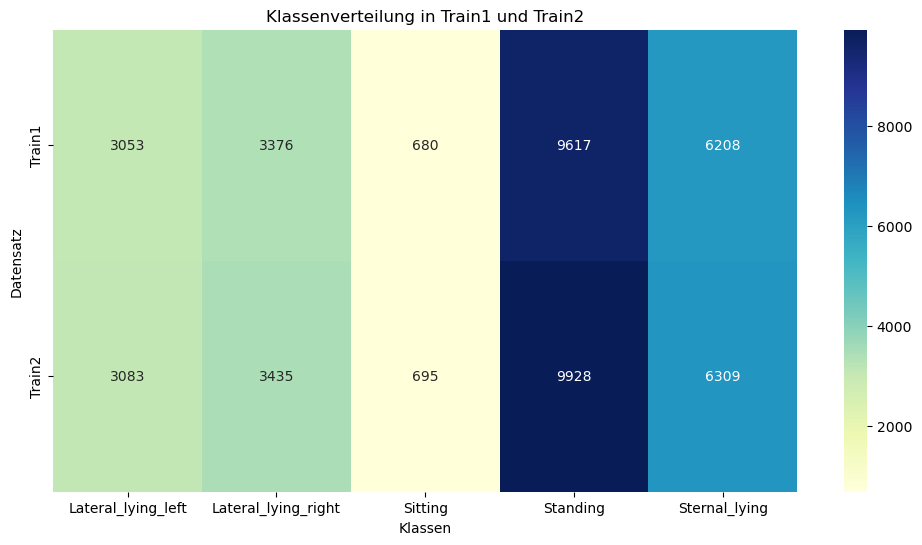

In [11]:
#erstelle eine heatmap der klassenverteilung in den Trainingsdaten von train1 und train2, um zu sehen, ob es eine ungleichmäßige Verteilung gibt.
import seaborn as sns
class_counts_train1 = train1['class_id'].value_counts().sort_index()
class_counts_train2 = train2['class_id'].value_counts().sort_index()
class_names = [pig_posture_classes[i] for i in class_counts_train1.index]
plt.figure(figsize=(12, 6))
sns.heatmap([class_counts_train1.values, class_counts_train2.values], annot=True, fmt='d', cmap='YlGnBu', xticklabels=class_names, yticklabels=['Train1', 'Train2'])
plt.title("Klassenverteilung in Train1 und Train2")
plt.xlabel("Klassen")
plt.ylabel("Datensatz")
plt.show()

In [14]:
#zeig mir ob es 0 Werte in der bbox Spalte gibt, die darauf hinweisen könnten, dass es Bilder gibt, bei denen keine Schweine erkannt wurden.
zero_bbox_train1 = train1[train1['bbox'] == '[]']
zero_bbox_train2 = train2[train2['bbox'] == '[]']
print(f"Anzahl Bilder mit leeren Bounding Boxes in Train1: {len(zero_bbox_train1)}")
print(f"Anzahl Bilder mit leeren Bounding Boxes in Train2: {len(zero_bbox_train2)}")


Anzahl Bilder mit leeren Bounding Boxes in Train1: 0
Anzahl Bilder mit leeren Bounding Boxes in Train2: 0


In [17]:
# 1. Test-Daten vorbereiten
# Wir fügen eine Dummy-Spalte hinzu, damit dein PigCropDataset nicht abstürzt
test_df_copy = test_df.copy()
test_df_copy['class_id'] = 0 

# Dataset und Loader für Testdaten (Identisch zu deinem Training)
test_ds = PigCropDataset(test_df_copy, test_images_path, transform=val_transforms)
test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=8, pin_memory=True)

# 2. Modell in den Vorhersage-Modus schalten
model.eval()
all_predictions = []

print("Erstelle Vorhersagen auf cuda:3...")
with torch.no_grad():
    for xb, _ in tqdm(test_dl):
        xb = xb.to(device) # Schiebt Daten auf cuda:3
        
        # Vorhersage berechnen
        outputs = model(xb)
        
        # Die Klasse mit dem höchsten Wert auswählen (0 bis 4)
        _, preds = torch.max(outputs, 1)
        
        # Ergebnisse sammeln
        all_predictions.extend(preds.cpu().numpy())

# 3. Die finale CSV-Datei erstellen
submission = pd.DataFrame({
    'row_id': test_df['row_id'],
    'class_id': all_predictions
})

# Als CSV speichern (ohne Index, wie von Kaggle verlangt)
submission.to_csv('submission.csv', index=False)

print(f"Erfolgreich! Die Datei 'submission.csv' mit {len(submission)} Zeilen wurde erstellt.")

NameError: name 'test_df' is not defined